<a href="https://colab.research.google.com/github/Panda1304/Digital_Image_Processing/blob/main/DIP_LAB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

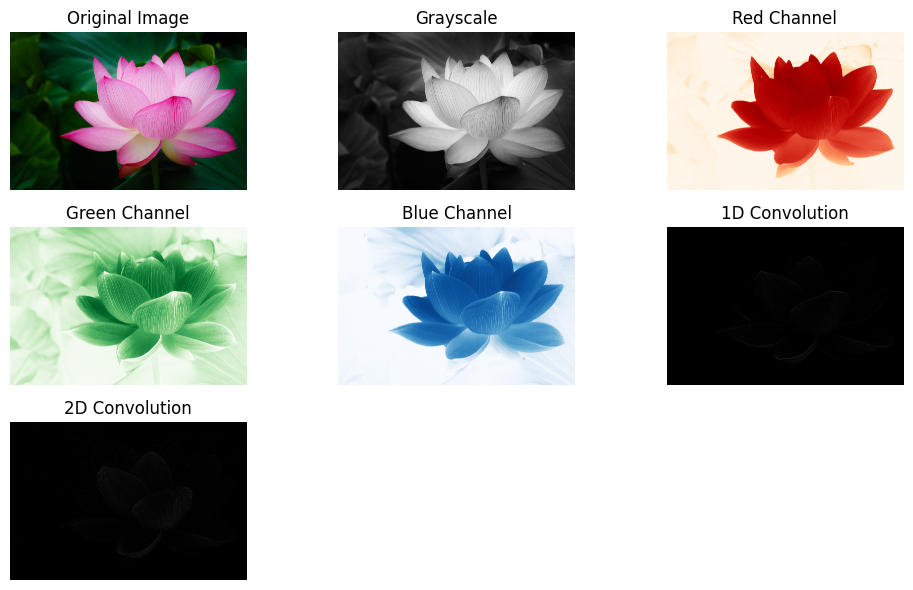

In [ ]:
#1
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image & convert to grayscale
image = cv2.imread(r'/content/lotus-flowers-15-1113481920.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Split into RGB channels
b, g, r = cv2.split(image)

# Define convolution kernels
kernel_1d = np.array([1, 0, -1])  # Edge detection
kernel_2d = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]])  # Sharpening

# Apply convolutions
conv_1d = cv2.filter2D(gray, -1, kernel_1d)
conv_2d = cv2.filter2D(gray, -1, kernel_2d)

# Prepare images & titles for display
images = [cv2.cvtColor(image, cv2.COLOR_BGR2RGB), gray, r, g, b, conv_1d, conv_2d]
titles = ['Original Image', 'Grayscale', 'Red Channel', 'Green Channel',
          'Blue Channel', '1D Convolution', '2D Convolution']
cmaps = ['viridis', 'gray', 'OrRd', 'Greens', 'Blues', 'gray', 'gray']  # Colormaps for display

# Display images
plt.figure(figsize=(10, 6))
for i, (img, title, cmap) in enumerate(zip(images, titles, cmaps), 1):
    plt.subplot(3, 3, i)  # Arrange in 3x3 grid
    plt.imshow(img, cmap=cmap)  # Apply respective colormap
    plt.title(title), plt.axis('off')  # Add title & remove axes

plt.tight_layout()
plt.show()


<ipython-input-1-aaabdc5908df>:31: RuntimeWarning: invalid value encountered in cast
  divide = np.clip(divide, 0, 255).astype(np.uint8)


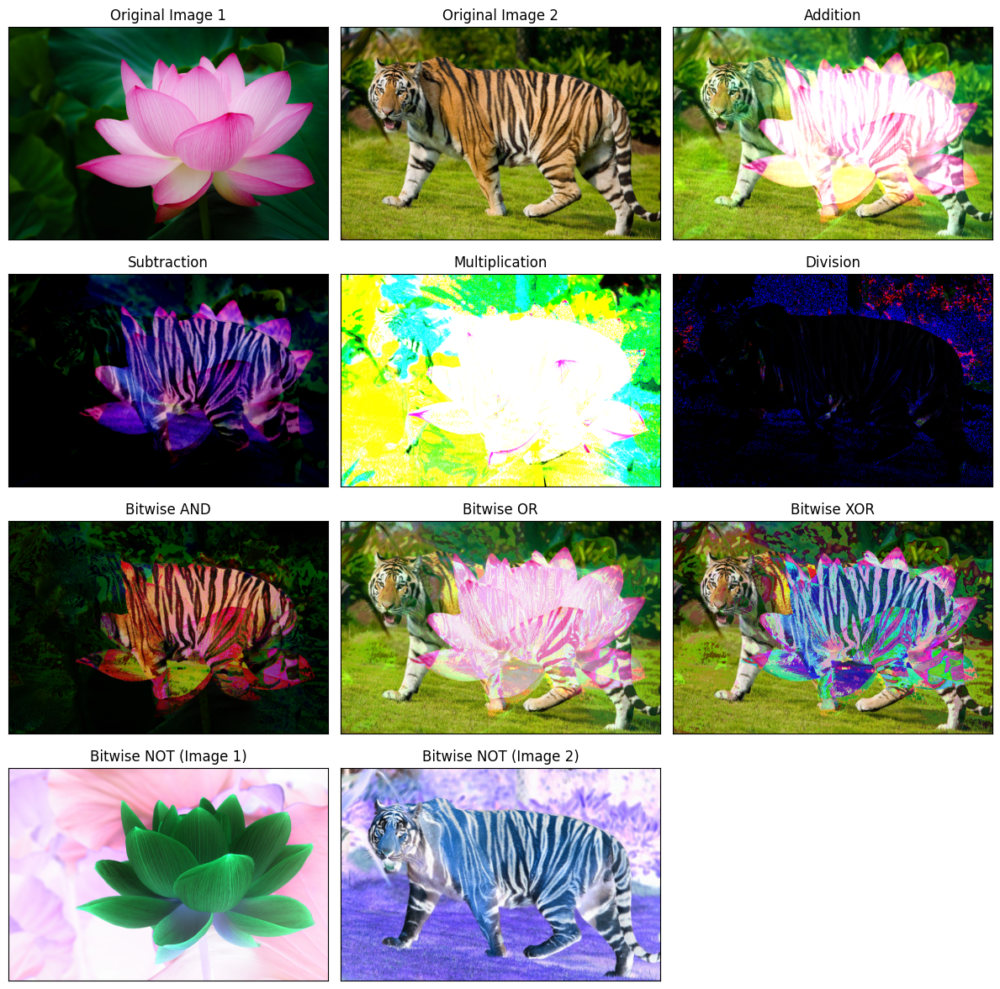

In [ ]:
#2
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load two images
img1 = cv2.imread('/content/lotus-flowers-15-1113481920.jpg')
img2 = cv2.imread('/content/2419657-3747825719.jpg')

# Check if images are loaded correctly
if img1 is None or img2 is None:
    raise ValueError("One or both images could not be loaded. Check file paths.")

# Resize img2 to match img1's dimensions
img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

# Convert images to float32 for division operation
img1 = img1.astype(np.float32)
img2 = img2.astype(np.float32)

# Perform arithmetic operations
add = cv2.add(img1, img2)
subtract = cv2.subtract(img1, img2)
multiply = cv2.multiply(img1, img2)
divide = cv2.divide(img1, img2)

# Convert images back to uint8 for display
add = np.clip(add, 0, 255).astype(np.uint8)
subtract = np.clip(subtract, 0, 255).astype(np.uint8)
multiply = np.clip(multiply, 0, 255).astype(np.uint8)
divide = np.clip(divide, 0, 255).astype(np.uint8)

# Perform logical operations
bitwise_and = cv2.bitwise_and(img1.astype(np.uint8), img2.astype(np.uint8))
bitwise_or = cv2.bitwise_or(img1.astype(np.uint8), img2.astype(np.uint8))
bitwise_xor = cv2.bitwise_xor(img1.astype(np.uint8), img2.astype(np.uint8))
bitwise_not_img1 = cv2.bitwise_not(img1.astype(np.uint8))
bitwise_not_img2 = cv2.bitwise_not(img2.astype(np.uint8))

# Display results including original images
titles = ['Original Image 1', 'Original Image 2', 'Addition', 'Subtraction',
          'Multiplication', 'Division', 'Bitwise AND', 'Bitwise OR',
          'Bitwise XOR', 'Bitwise NOT (Image 1)', 'Bitwise NOT (Image 2)']
images = [img1.astype(np.uint8), img2.astype(np.uint8), add, subtract, multiply,
          divide, bitwise_and, bitwise_or, bitwise_xor, bitwise_not_img1, bitwise_not_img2]

plt.figure(figsize=(12, 12))
for i in range(len(images)):
    plt.subplot(4, 3, i+1)  # Changed grid to fit original images
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()


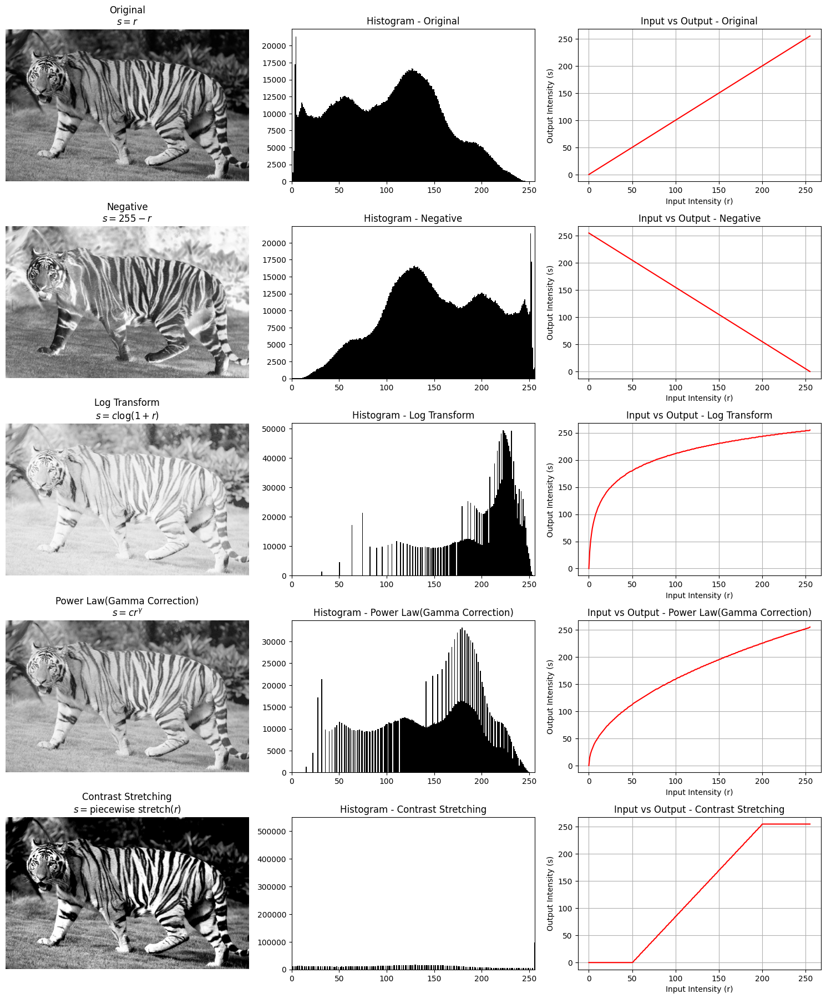

In [ ]:
#3
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image in grayscale
image = cv2.imread('/content/2419657-3747825719.jpg', cv2.IMREAD_GRAYSCALE)
if image is None:
    raise ValueError("Error: Image could not be loaded. Check the file path.")

# Define transformations
c, gamma = 255 / np.log(1 + 255), 0.5  # Log and gamma correction constants
r_values = np.arange(256, dtype=np.uint8)

# Contrast Stretching - Piecewise Linear
r1, s1, r2, s2 = 50, 0, 200, 255
contrast_map = np.array([s1 / r1 * r if r < r1 else
                         (s2 - s1) / (r2 - r1) * (r - r1) + s1 if r <= r2 else
                         (255 - s2) / (255 - r2) * (r - r2) + s2 for r in range(256)], dtype=np.uint8)
contrast_stretched = contrast_map[image]

# Define transformations with mappings
transformations = [
    ("Original", image, r"$s = r$", r_values),
    ("Negative", 255 - image, r"$s = 255 - r$", 255 - r_values),
    ("Log Transform", np.uint8(c * np.log1p(image)), r"$s = c \log(1 + r)$", np.uint8(c * np.log1p(r_values))),
    ("Power Law(Gamma Correction)", np.uint8((image / 255.0) ** gamma * 255), r"$s = c r^\gamma$", np.uint8((r_values / 255.0) ** gamma * 255)),
    ("Contrast Stretching", contrast_stretched, r"$s = \text{piecewise stretch}(r)$", contrast_map)
]

# Plot images, histograms, and mappings
plt.figure(figsize=(15, 18))
for i, (name, img, formula, mapping) in enumerate(transformations):
    plt.subplot(5, 3, 3 * i + 1), plt.imshow(img, cmap='gray'), plt.title(f"{name}\n{formula}"), plt.axis('off')
    plt.subplot(5, 3, 3 * i + 2), plt.hist(img.ravel(), bins=256, range=[0, 256], color='black'), plt.title(f"Histogram - {name}"), plt.xlim([0, 256])
    plt.subplot(5, 3, 3 * i + 3), plt.plot(r_values, mapping, color='red'), plt.title(f"Input vs Output - {name}"), plt.xlabel("Input Intensity (r)"), plt.ylabel("Output Intensity (s)"), plt.grid()

plt.tight_layout()
plt.show()

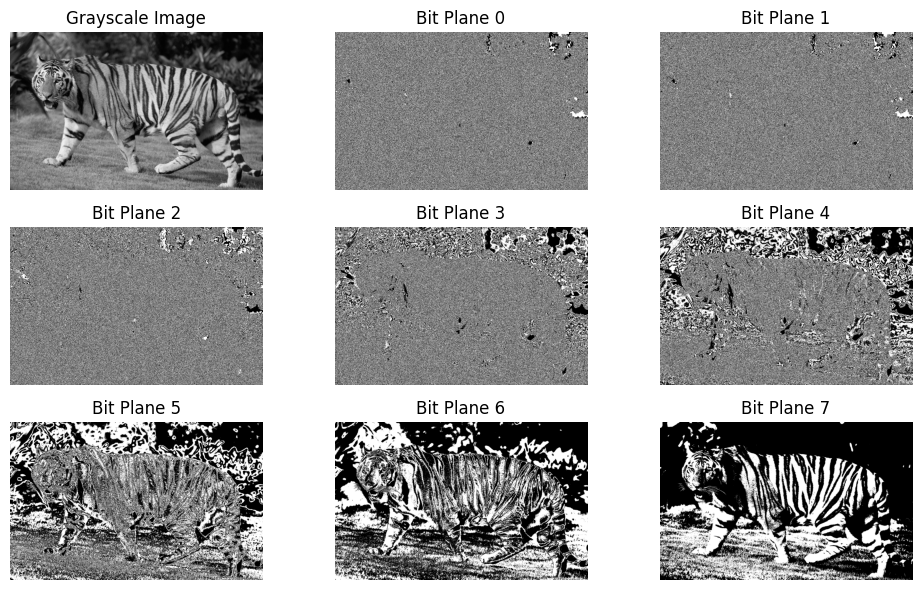

In [ ]:
#4
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image & convert to grayscale
gray = cv2.cvtColor(cv2.imread('/content/2419657-3747825719.jpg'), cv2.COLOR_BGR2GRAY)

# Extract bit planes (0-7) using bitwise AND & normalize for visualization
bit_planes = [(np.bitwise_and(gray, 2**i) > 0) * 255 for i in range(8)]  # Convert bits to 0 or 255

# Prepare images & titles for display
images = [gray] + bit_planes  # Include grayscale + all bit planes
titles = ['Grayscale Image'] + [f'Bit Plane {i}' for i in range(8)]

# Display grayscale & bit plane images
plt.figure(figsize=(10, 6))
for i, (img, title) in enumerate(zip(images, titles), 1):
    plt.subplot(3, 3, i)  # Arrange in 3x3 grid
    plt.imshow(img, cmap='gray')  # Show image in grayscale
    plt.title(title), plt.axis('off')  # Add title & remove axes

plt.tight_layout()
plt.show()  # Display the images


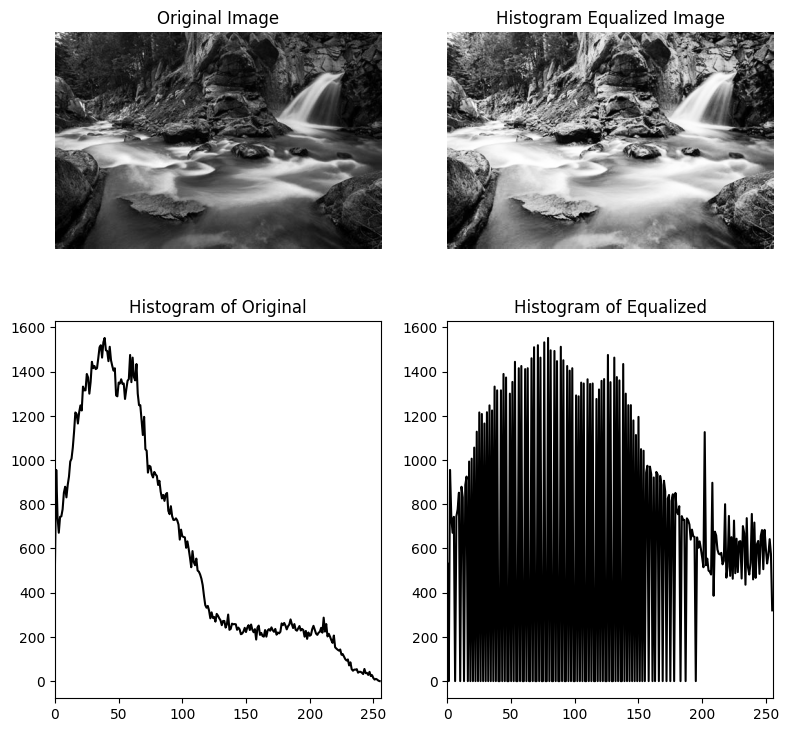

In [ ]:
#5
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load and convert to grayscale
gray = cv2.cvtColor(cv2.imread('/content/th-3874435018.jpeg'), cv2.COLOR_BGR2GRAY)

# Apply histogram equalization
equalized_gray = cv2.equalizeHist(gray)

# Function to plot histogram
def plot_hist(img, title, pos):
    plt.subplot(2, 2, pos)
    plt.plot(cv2.calcHist([img], [0], None, [256], [0, 256]), color='black')
    plt.title(title), plt.xlim([0, 256])

# Display images and histograms
titles = ['Original Image', 'Histogram Equalized Image']
images = [gray, equalized_gray]

plt.figure(figsize=(8, 8))

for i, (img, title) in enumerate(zip(images, titles), 1):
    plt.subplot(2, 2, i)
    plt.imshow(img, cmap='gray'), plt.title(title), plt.axis('off')

plot_hist(gray, 'Histogram of Original', 3)
plot_hist(equalized_gray, 'Histogram of Equalized', 4)

plt.tight_layout()
plt.show()


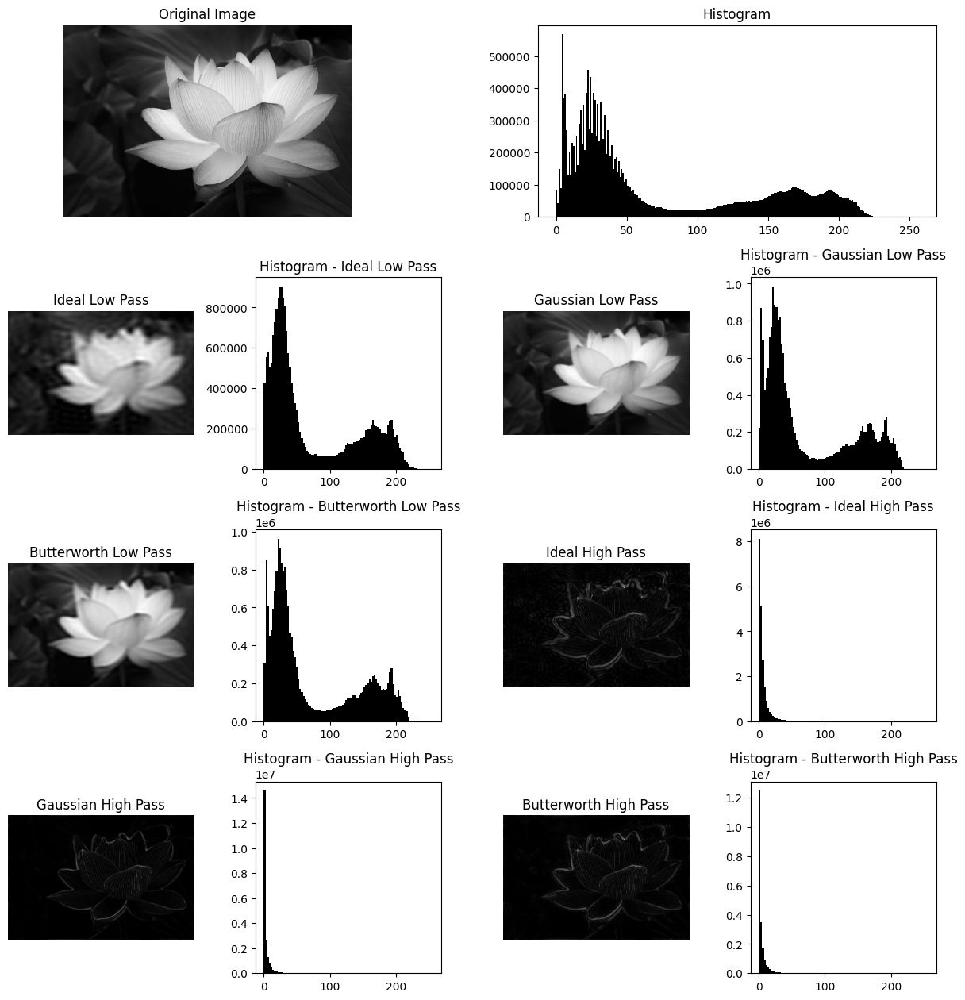

In [ ]:
#6
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Apply frequency filter (Low/High-pass: Ideal, Gaussian, Butterworth)
def apply_filter(img, f_type, f_name, cutoff, order=4):
    u, v = np.meshgrid(np.arange(img.shape[1]) - img.shape[1]//2,
                        np.arange(img.shape[0]) - img.shape[0]//2)
    D = np.sqrt(u**2 + v**2)  # Distance matrix

    H = (D <= cutoff).astype(np.float32) if f_name == 'ideal' else \
        np.exp(-(D**2) / (2 * cutoff**2)) if f_name == 'gaussian' else \
        1 / (1 + (D / cutoff)**(2 * order))  # Butterworth

    return np.abs(np.fft.ifft2(np.fft.ifftshift(np.fft.fftshift(np.fft.fft2(img)) * (1 - H if f_type == 'highpass' else H))))

# Load grayscale image
img = cv2.imread('/content/lotus-flowers-15-1113481920.jpg', 0)

# Filter settings: (Filter Type, Name, Title, Cutoff)
filters = [
    ('lowpass', 'ideal', "Ideal Low Pass", 20),
    ('lowpass', 'gaussian', "Gaussian Low Pass", 40),
    ('lowpass', 'butterworth', "Butterworth Low Pass", 30),
    ('highpass', 'ideal', "Ideal High Pass", 20),
    ('highpass', 'gaussian', "Gaussian High Pass", 40),
    ('highpass', 'butterworth', "Butterworth High Pass", 30)
]

plt.figure(figsize=(12, 22))

# Display Original Image & Histogram
plt.subplot(len(filters) + 1, 2, 1), plt.imshow(img, cmap='gray'), plt.title("Original Image"), plt.axis('off')
plt.subplot(len(filters) + 1, 2, 2), plt.hist(img.ravel(), bins=256, range=[0, 256], color='black'), plt.title("Histogram")

# Apply filters and plot images with histograms
for i, (f_type, f_name, title, cutoff) in enumerate(filters, start=2):
    filtered = apply_filter(img, f_type, f_name, cutoff)
    plt.subplot(len(filters) + 1, 4, 2 * i + 1), plt.imshow(filtered, cmap='gray'), plt.title(title), plt.axis('off')
    plt.subplot(len(filters) + 1, 4, 2 * i + 2), plt.hist(filtered.ravel(), bins=100, range=[0, 256], color='black'), plt.title(f"Histogram - {title}")

plt.tight_layout()
plt.show()


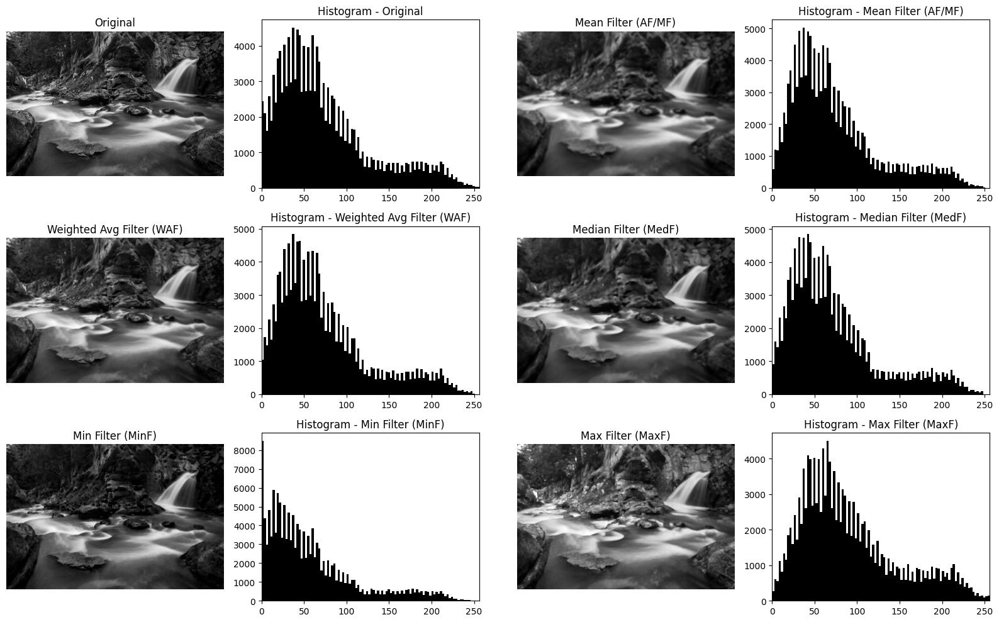

In [ ]:
#7
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
img = cv2.imread('/content/th-3874435018.jpeg', 0)

# Define filters
kernel = np.ones((3, 3), np.uint8)
filters = [
    ("Original", img),
    ("Mean Filter (AF/MF)", cv2.blur(img, (5, 5))),
    ("Weighted Avg Filter (WAF)", cv2.filter2D(img, -1, np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]]) / 16)),
    ("Median Filter (MedF)", cv2.medianBlur(img, 5)),
    ("Min Filter (MinF)", cv2.erode(img, kernel)),
    ("Max Filter (MaxF)", cv2.dilate(img, kernel))
]

# Create figure (3 rows, 4 columns for 6 filters)
plt.figure(figsize=(16, 10))

for i in range(6):
    name, filtered = filters[i]

    # Image
    plt.subplot(3, 4, 2 * i + 1)
    plt.imshow(filtered, cmap='gray')
    plt.title(name)
    plt.axis('off')

    # Histogram
    plt.subplot(3, 4, 2 * i + 2)
    plt.hist(filtered.ravel(), bins=100, range=[0, 256], color='black')
    plt.title(f"Histogram - {name}")
    plt.xlim([0, 256])

plt.tight_layout()
plt.show()


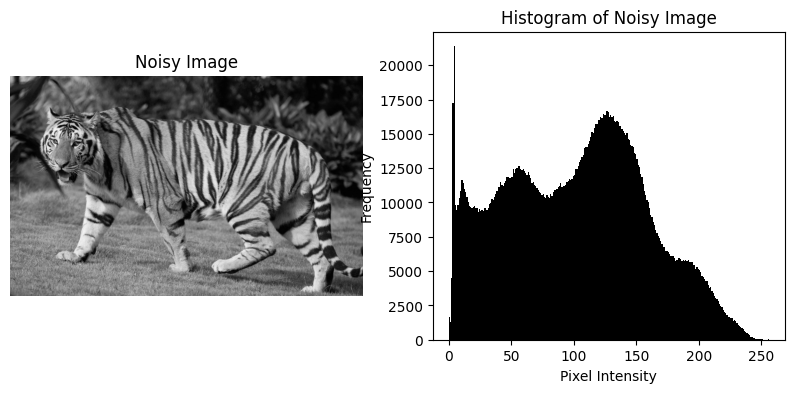

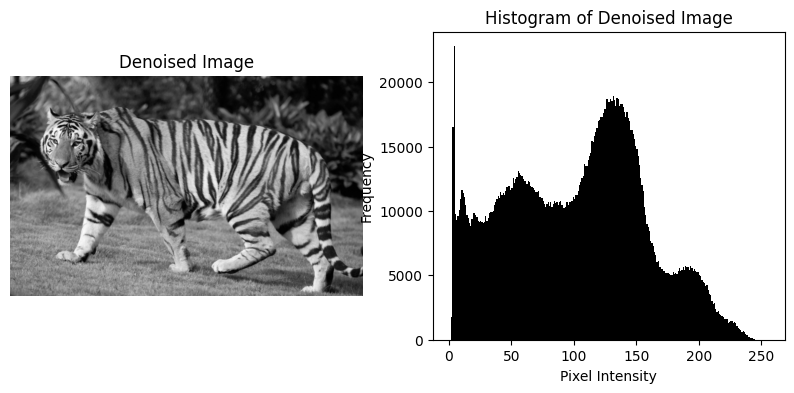

In [ ]:
#8
import cv2
import matplotlib.pyplot as plt

# Load grayscale image
img = cv2.imread("/content/2419657-3747825719.jpg", 0)

# Apply median filter to remove salt-and-pepper noise
denoised = cv2.medianBlur(img, 5)

# Titles and images
titles = ["Noisy Image", "Denoised Image"]
images = [img, denoised]

# Display images and histograms
for i in range(2):
    plt.figure(figsize=(10, 4))

    # Image
    plt.subplot(1, 2, 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

    # Histogram
    plt.subplot(1, 2, 2)
    plt.hist(images[i].ravel(), bins=256, range=[0, 256], color='black')
    plt.title(f"Histogram of {titles[i]}")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

    plt.show()


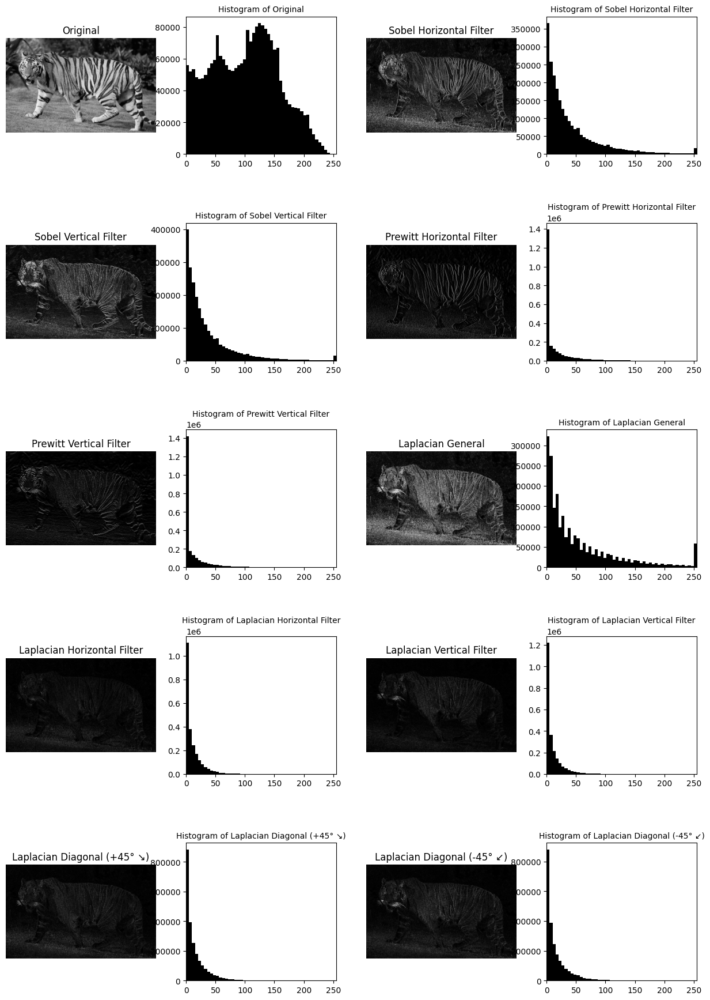

In [ ]:
#9
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
image = cv2.imread('/content/2419657-3747825719.jpg', 0)

# Define Edge detection filters or Gradient Based Edge Detection Filters
filters = {
    "Original": image,
    "Sobel Horizontal Filter": cv2.convertScaleAbs(cv2.Sobel(image, cv2.CV_16S, 1, 0, ksize=3)),  # Filters out Horizontal Lines
    "Sobel Vertical Filter": cv2.convertScaleAbs(cv2.Sobel(image, cv2.CV_16S, 0, 1, ksize=3)),  # Filters out Vertical Lines
    "Prewitt Horizontal Filter": cv2.filter2D(image, -1, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])),  # Filters out Horizontal Lines
    "Prewitt Vertical Filter": cv2.filter2D(image, -1, np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])),  # Filters out Vertical Lines
    "Laplacian General": cv2.convertScaleAbs(cv2.Laplacian(image, cv2.CV_16S, ksize=3)),
    "Laplacian Horizontal Filter": cv2.convertScaleAbs(cv2.filter2D(image, cv2.CV_16S, np.array([[0, 0, 0], [1, -2, 1], [0, 0, 0]]))),
    "Laplacian Vertical Filter": cv2.convertScaleAbs(cv2.filter2D(image, cv2.CV_16S, np.array([[0, 1, 0], [0, -2, 0], [0, 1, 0]]))),
    "Laplacian Diagonal (+45° ↘)": cv2.convertScaleAbs(cv2.filter2D(image, cv2.CV_16S, np.array([[1, 0, 0], [0, -2, 0], [0, 0, 1]]))),
    "Laplacian Diagonal (-45° ↙)": cv2.convertScaleAbs(cv2.filter2D(image, cv2.CV_16S, np.array([[0, 0, 1], [0, -2, 0], [1, 0, 0]]))),
}

# Display results using plt.figure()
plt.figure(figsize=(15, 45))  # Fixed height for 10 filters
for i, (title, img) in enumerate(filters.items()):
    plt.subplot(10, 4, 2 * i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(title, fontsize=12)
    plt.axis('off')

    plt.subplot(10, 4, 2 * i + 2)
    plt.hist(img.ravel(), bins=50, range=(0, 255), color='black')
    plt.title(f"Histogram of {title}", fontsize=10)
    plt.xlim([0, 255])

plt.subplots_adjust(left=0.1, right=0.9, hspace=0.5)  # Adjust spacing
plt.show()


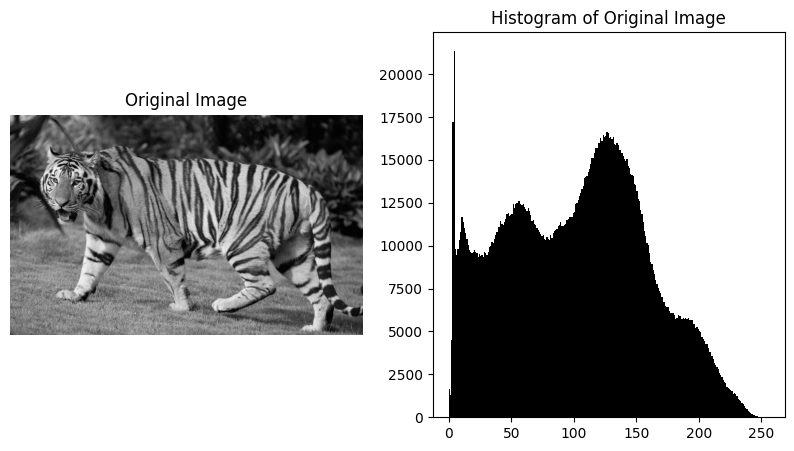

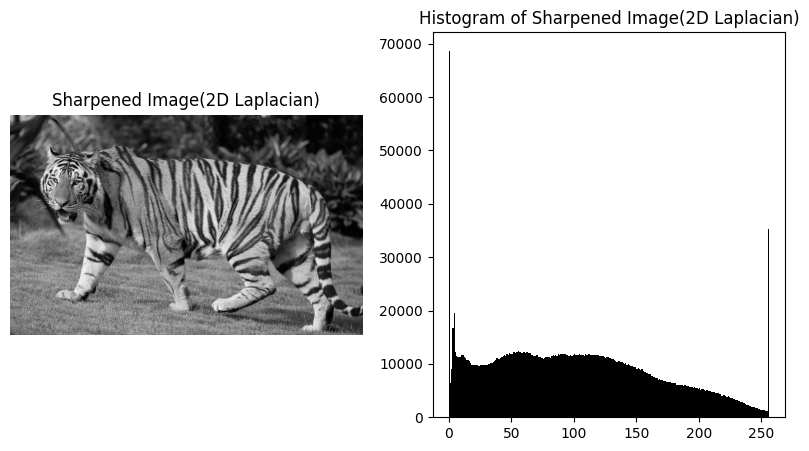

In [ ]:
#10
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
img = cv2.imread('/content/2419657-3747825719.jpg', 0)

# Apply 2D Laplacian filter (sharpening)
sharpened = cv2.filter2D(img, -1, np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]]))

# Display Original and Sharpened images with histograms
images = [img, sharpened]
titles = ["Original Image", "Sharpened Image(2D Laplacian)"]

for i in range(2):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

    # Histogram
    plt.subplot(1, 2, 2)
    plt.hist(images[i].ravel(), bins=256, range=[0, 256], color='black')
    plt.title(f"Histogram of {titles[i]}")

    plt.show()


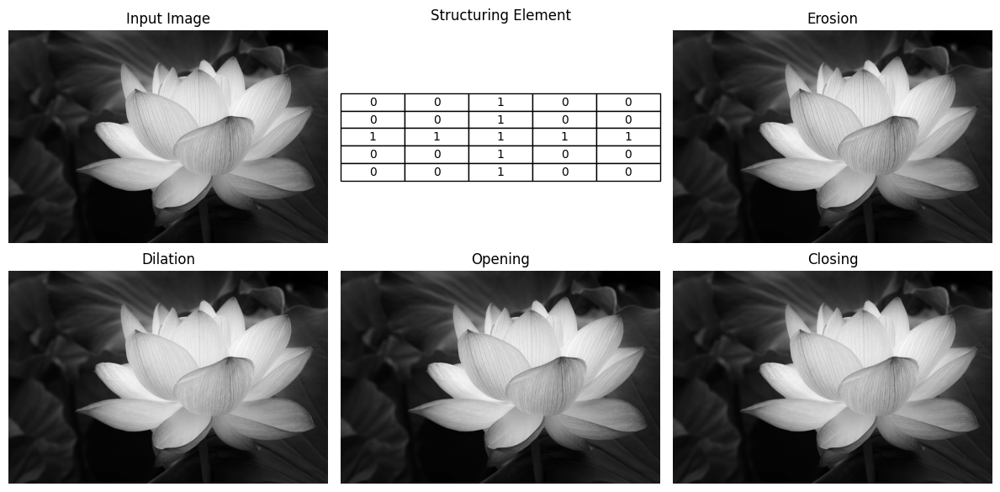

In [ ]:
#11
#Output from Segmentation(image segments) is used as input for morphological processing
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
image = cv2.imread('/content/lotus-flowers-15-1113481920.jpg', 0)

# Define a cross-shaped structuring element
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (5, 5))

# Apply morphological operations
erosion = cv2.erode(image, kernel)
dilation = cv2.dilate(image, kernel)
opening = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)

# Display images with titles
titles = ["Input Image", "Structuring Element", "Erosion", "Dilation", "Opening", "Closing"]
images = [image, None, erosion, dilation, opening, closing]  # Placeholder for structuring element

plt.figure(figsize=(12, 6))

for i, (img, title) in enumerate(zip(images, titles), 1):
    plt.subplot(2, 3, i)
    if img is None:  # Display structuring element as a table
        plt.axis("off")
        plt.table(cellText=kernel.tolist(), cellLoc='center', loc='center')
    else:
        plt.imshow(img, cmap='gray')
        plt.axis("off")

    plt.title(title)

plt.tight_layout()
plt.show()


<ipython-input-6-08643f0a0e16>:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return cv2.rectangle(img, (x, y), (x+w, y+h), int(mean), -1)


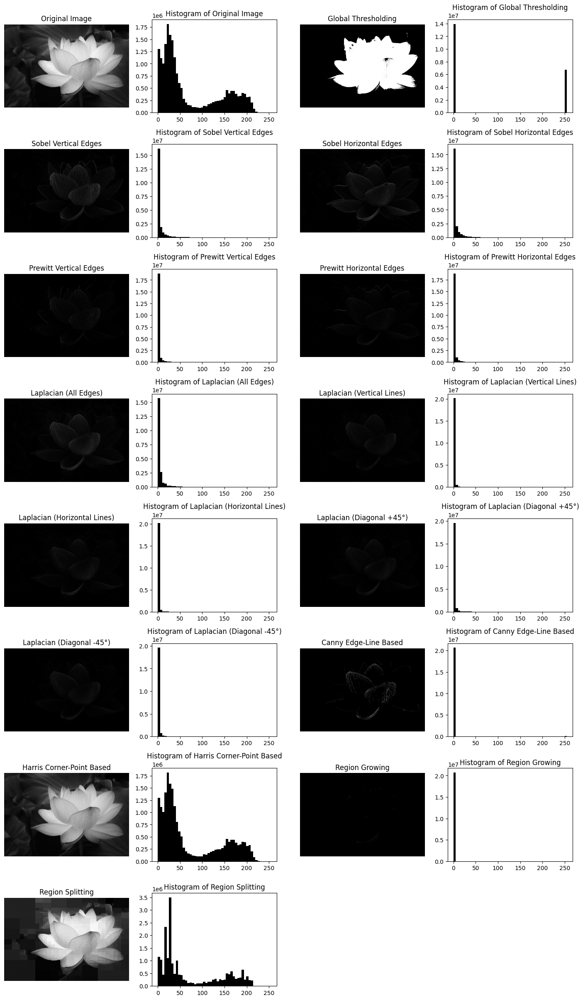

In [ ]:
#12
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
image = cv2.imread("/content/lotus-flowers-15-1113481920.jpg", cv2.IMREAD_GRAYSCALE)

# 1. Thresholding Based Segmentation (Otsu Thresholding)
_, global_thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# 2. Discontinuities Based Segmentation (Point, Line & Edge Detection)
sobel_x = cv2.convertScaleAbs(cv2.Sobel(image, cv2.CV_16S, 1, 0, ksize=3))
sobel_y = cv2.convertScaleAbs(cv2.Sobel(image, cv2.CV_16S, 0, 1, ksize=3))
prewitt_x = cv2.filter2D(image, -1, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
prewitt_y = cv2.filter2D(image, -1, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))
laplacian = cv2.convertScaleAbs(cv2.Laplacian(image, cv2.CV_16S, ksize=3))

# Laplacian Edge Detection (Various Orientations)
laplacian_kernels = [
    np.array([[0, 0, 0], [1, -2, 1], [0, 0, 0]]), #Horizontal Filter
    np.array([[0, 1, 0], [0, -2, 0], [0, 1, 0]]), #Vertical Filter
    np.array([[1, 0, 0], [0, -2, 0], [0, 0, 1]]), #+45 deg Filter
    np.array([[0, 0, 1], [0, -2, 0], [1, 0, 0]])  #-45 deg Filter
]
laplacians = [cv2.convertScaleAbs(cv2.filter2D(image, cv2.CV_16S, k)) for k in laplacian_kernels]

# Line & Point Detection
canny_edges = cv2.Canny(image, 50, 150)
harris_corners = np.where(cv2.dilate(cv2.cornerHarris(image, 2, 3, 0.04), None) > 0.01 * cv2.cornerHarris(image, 2, 3, 0.04).max(), 255, image)

# 3. Region-Based Segmentation (Region Growing & Splitting)
flood_mask = np.zeros((image.shape[0] + 2, image.shape[1] + 2), np.uint8)
region_growing = cv2.bitwise_not(cv2.floodFill(image.copy(), flood_mask, (image.shape[0]//2, image.shape[1]//2), 255, loDiff=10, upDiff=10)[1])

def region_split(img, x, y, w, h, threshold=10):
    sub_img = img[y:y+h, x:x+w]
    mean, stddev = cv2.meanStdDev(sub_img)
    if stddev < threshold or w < 10 or h < 10:
        return cv2.rectangle(img, (x, y), (x+w, y+h), int(mean), -1)
    for nx, ny, nw, nh in [(x, y, w//2, h//2), (x+w//2, y, w//2, h//2), (x, y+h//2, w//2, h//2), (x+w//2, y+h//2, w//2, h//2)]:
        region_split(img, nx, ny, nw, nh, threshold)
    return img

region_splitting = region_split(image.copy(), 0, 0, image.shape[1], image.shape[0])

# Image Titles & Data
titles = [
    "Original Image", "Global Thresholding",
    "Sobel Vertical Edges", "Sobel Horizontal Edges",
    "Prewitt Vertical Edges", "Prewitt Horizontal Edges",
    "Laplacian (All Edges)",
    "Laplacian (Vertical Lines)", "Laplacian (Horizontal Lines)",
    "Laplacian (Diagonal +45°)", "Laplacian (Diagonal -45°)",
    "Canny Edge-Line Based", "Harris Corner-Point Based",
    "Region Growing", "Region Splitting"
]
images = [image, global_thresh, sobel_x, sobel_y, prewitt_x, prewitt_y, laplacian] + laplacians + [canny_edges, harris_corners, region_growing, region_splitting]

# Display Results
plt.figure(figsize=(14, 45))
for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(len(images), 4, 2*i+1), plt.imshow(img, cmap="gray"), plt.title(title), plt.axis("off")
    plt.subplot(len(images), 4, 2*i+2), plt.hist(img.ravel(), bins=50, range=(0, 255), color="black"), plt.title(f"Histogram of {title}")

plt.tight_layout()
plt.show()


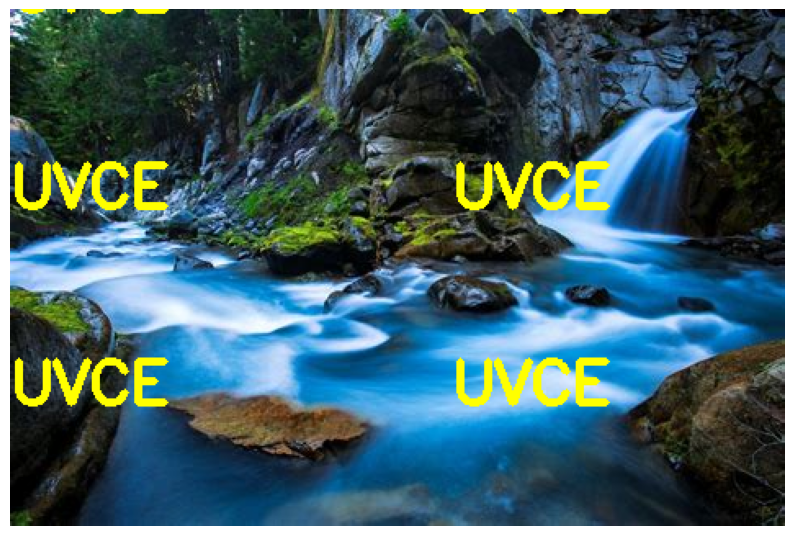

In [ ]:
#13
import cv2
import matplotlib.pyplot as plt

def add_text_watermark(file, out, mark, size=90, space=30):
    img = cv2.imread(file)  # Load image

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert for Matplotlib
    h, w = img.shape[:2]  # Get dimensions

    # Apply repeating watermark (change size/space to adjust density)
    for y in range(0, h, size + space):
        for x in range(0, w, size * 3):
            cv2.putText(img, mark, (x, y), cv2.FONT_HERSHEY_SIMPLEX, size / 75,
                        (255, 255, 0), max(2, size // 20))

    cv2.imwrite(out, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))  # Save result
    plt.figure(figsize=(10,10))
    plt.imshow(img), plt.axis('off')  # Show output
    plt.show()

# Example usage
add_text_watermark("/content/th-3874435018.jpeg", "watermarked.jpeg", "UVCE")

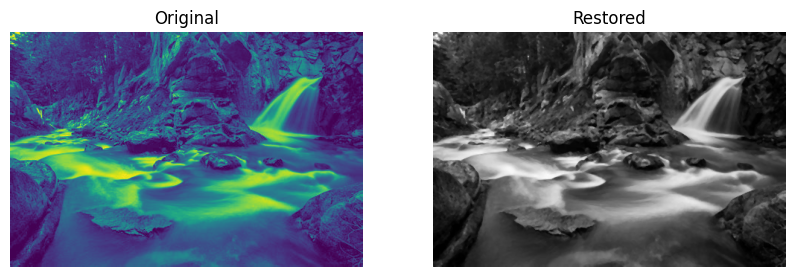

In [ ]:
#14
import cv2
import matplotlib.pyplot as plt

def restore_image(image_path, ksize=3):
    img = cv2.imread(image_path,0)

    restored = cv2.medianBlur(img, ksize)  # Apply median filter to reduce noise

    # Display original & restored images
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    for i, (im, title, cmap) in enumerate(zip([img, restored], ["Original", "Restored"], [None, "gray"])):
        ax[i].imshow(im if cmap is None else im, cmap=cmap)
        ax[i].set_title(title), ax[i].axis("off")

    plt.show()

# Example usage
restore_image("/content/th-3874435018.jpeg", ksize=3)

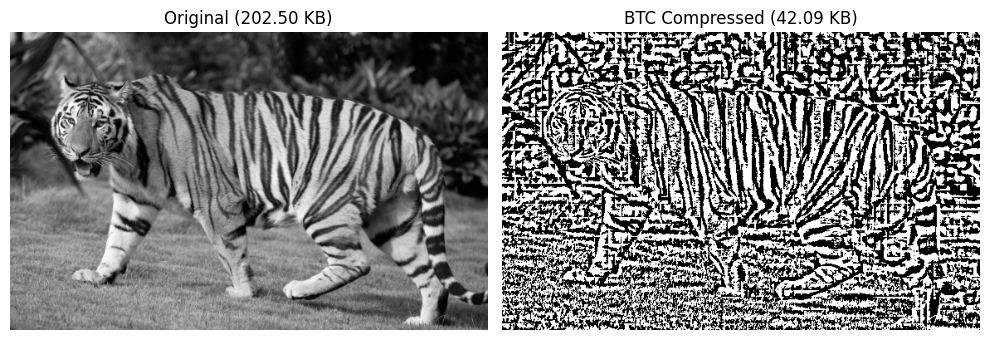

In [ ]:
#15
import cv2
import numpy as np
import matplotlib.pyplot as plt

def btc_compress(img_path, block=8, scale=0.3):
    img = cv2.resize(cv2.imread(img_path, 0), (0, 0), fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    h, w = img.shape
    comp = np.zeros_like(img)

    for i in range(0, h, block):
        for j in range(0, w, block):
            blk = img[i:i+block, j:j+block]
            comp[i:i+block, j:j+block] = np.where(blk <= np.mean(blk), 0, 255)

    # Compute actual file sizes
    orig_size = img.nbytes / 1024  # Original size in KB
    _, comp_encoded = cv2.imencode('.jpg', comp, [cv2.IMWRITE_JPEG_QUALITY, 10])
    comp_size = len(comp_encoded) / 1024  # Compressed size in KB

    # Display results
    titles = [f"Original ({orig_size:.2f} KB)", f"BTC Compressed ({comp_size:.2f} KB)"]
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    for i, (im, title) in enumerate(zip([img, comp], titles)):
        ax[i].imshow(im, cmap='gray'), ax[i].axis("off"), ax[i].set_title(title)
    plt.tight_layout(), plt.show()

# Example Usage
btc_compress(r'/content/2419657-3747825719.jpg')

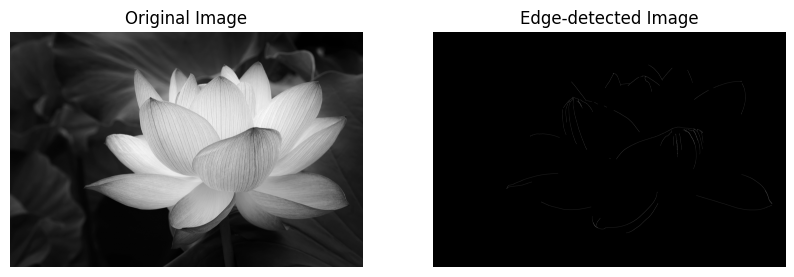

In [ ]:
#16
import cv2
import matplotlib.pyplot as plt

def edge_detection(image_path, low, high):
    img = cv2.imread(image_path, 0)  # Load the image in grayscale
    edges = cv2.Canny(cv2.GaussianBlur(img, (5, 5), 1.4), low, high)  # Apply Gaussian blur & then Canny edge detection

    # Display the original and edge-detected images
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    for i, (im, title) in enumerate(zip([img, edges], ["Original Image", "Edge-detected Image"])):
        ax[i].imshow(im, cmap='gray')  # Show image in grayscale
        ax[i].axis("off")  # Hide axis for cleaner display
        ax[i].set_title(title)  # Set the title

    plt.show()

# Run the function with an example image and thresholds
edge_detection('/content/lotus-flowers-15-1113481920.jpg', 50, 150)